# BBM418 Computer Vision Assignment 2
## Homography Estimation
### Student ID: b2220356053

## Part 1: Feature Extraction

In this part, feature detection and descriptor extraction implemented using two different methods (I couldn't make SURF work because of OPENCV limitations):
- **SIFT** (Scale-Invariant Feature Transform): Good for detecting features at different scales and rotations
- **ORB** (Oriented FAST and Rotated BRIEF): Binary descriptor, very fast but less robust

These features are important for homography estimation because they help us find corresponding points between images that are taken from different viewpoints.

In [1]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

# Set up matplotlib for better visualization
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['figure.dpi'] = 100

In [2]:
# Define dataset paths
BASE_DIR = Path('/home/oguzhan/Projects/BBM416_Projects/Second_Assignment')
PANORAMA_DATASET_DIR = BASE_DIR / 'pa2_data' / 'panorama_dataset'

# List all available scenes
scenes = [d for d in PANORAMA_DATASET_DIR.iterdir() if d.is_dir()]
scene_names = [s.name for s in scenes]

for i, name in enumerate(scene_names, 1):
    print(f"  {i}. {name}")

  1. v_boat
  2. v_weapons
  3. v_bird
  4. v_graffiti
  5. v_soldiers
  6. v_circus


### 1.1 Feature Detector Initialization

In [3]:
# Initialize feature detectors
# SIFT - Scale Invariant Feature Transform
# Good at detecting corners and blobs at different scales
sift = cv2.SIFT_create()

# ORB - Oriented FAST and Rotated BRIEF
# Binary descriptor, very fast, rotation invariant
# Good for real-time applications
orb = cv2.ORB_create(nfeatures=2000)  # Increase max features for better matching

### 1.2 Feature Extraction Function

This function will:
1. Load an image in grayscale (feature detectors work on intensity)
2. Detect keypoints using the specified detector
3. Compute descriptors for each keypoint
4. Return both keypoints and descriptors for matching later

In [4]:
def extract_features(image_path, detector, detector_name="Unknown"):
    """
    Extract keypoints and descriptors from an image using the specified detector.
    
    Args:
        image_path: Path to the input image
        detector: Feature detector object (SIFT or ORB)
        detector_name: Name of the detector for printing
    
    Returns:
        img_color: Original color image for visualization
        img_gray: Grayscale image
        keypoints: List of detected keypoints
        descriptors: Array of descriptors for each keypoint
    """
    # Read the image in color for visualization
    img_color = cv2.imread(str(image_path))
    if img_color is None:
        raise ValueError(f"Could not read image: {image_path}")
    
    # Convert to RGB for matplotlib (OpenCV uses BGR by default)
    img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
    
    # Convert to grayscale for feature detection
    # detectors work on intensity values, not color
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_RGB2GRAY)
    
    # Detect keypoints and compute descriptors
    # keypoints: location, scale, orientation of features
    # descriptors: numerical representation for matching
    keypoints, descriptors = detector.detectAndCompute(img_gray, None)
    
    return img_color, img_gray, keypoints, descriptors

### 1.3 Visualization Function

Create a function to visualize detected keypoints on images. This helps us understand:
- Where features are detected (corners, edges, textured regions)
- How many features each detector finds
- The spatial distribution of features across the image

In [5]:
def visualize_keypoints(img_color, keypoints, detector_name, image_name):
    """
    Visualize detected keypoints on the image.
    
    Args:
        img_color: Color image
        keypoints: List of detected keypoints
        detector_name: Name of the detector used
        image_name: Name of the image file
    
    Returns:
        img_with_keypoints: Image with keypoints drawn
    """
    # Draw keypoints on the image
    # The circles show the location and scale of each keypoint
    # Larger circles indicate features detected at larger scales
    img_with_keypoints = cv2.drawKeypoints(
        img_color, 
        keypoints, 
        None,
        color=(0, 255, 0),  # Green color for keypoints
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS  # Show scale and orientation
    )
    
    return img_with_keypoints


def compare_detectors_on_image(image_path, detectors_dict):
    """
    Compare multiple feature detectors on a single image.
    
    Args:
        image_path: Path to the image
        detectors_dict: Dictionary of {name: detector_object}
    """
    image_name = Path(image_path).name
    num_detectors = len(detectors_dict)
    
    # Create subplots for comparison
    fig, axes = plt.subplots(1, num_detectors + 1, figsize=(5 * (num_detectors + 1), 5))
    
    # Show original image first
    img_color = cv2.imread(str(image_path))
    img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
    axes[0].imshow(img_color)
    axes[0].set_title(f'Original Image\n{image_name}', fontsize=12)
    axes[0].axis('off')
    
    # Process each detector
    for idx, (name, detector) in enumerate(detectors_dict.items(), 1):            
        # Extract features
        img_color, img_gray, keypoints, descriptors = extract_features(
            image_path, detector, name
        )
        
        # Visualize keypoints
        img_with_kp = visualize_keypoints(img_color, keypoints, name, image_name)
        
        # Display
        axes[idx].imshow(img_with_kp)
        axes[idx].set_title(f'{name}\n{len(keypoints)} keypoints', fontsize=12)
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

### 1.4 Testing Feature Extraction

Let's test the feature extraction on sample images from each scene. I'll compare all three detectors side-by-side to see their differences.

Testing feature extraction on sample images from each scene:


Processing scene: v_boat
------------------------------------------------------------


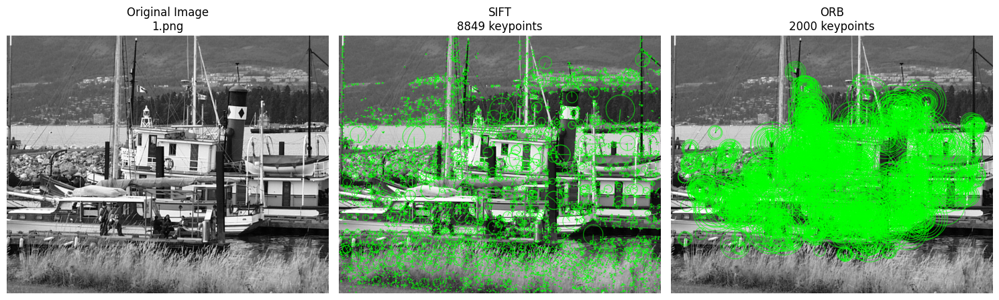


Processing scene: v_weapons
------------------------------------------------------------


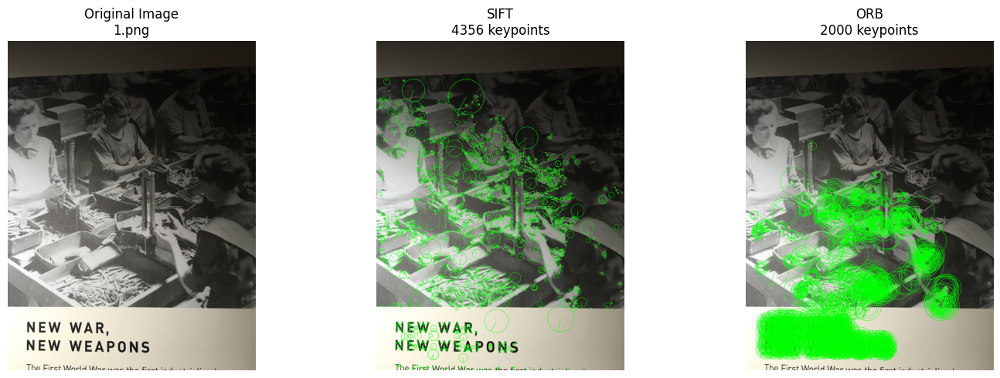


Processing scene: v_bird
------------------------------------------------------------


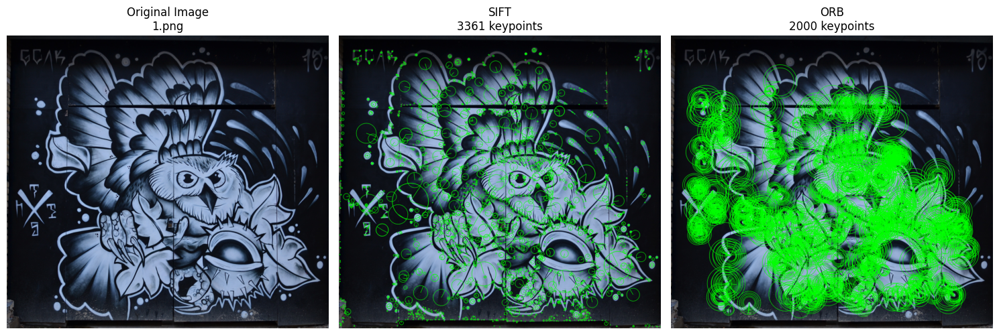

In [6]:
# Create a dictionary of all detectors
detectors = {
    'SIFT': sift,
    'ORB': orb
}

# Test on one image from each scene
print("Testing feature extraction on sample images from each scene:\n")
print("="*60)

for scene_name in scene_names[:3]:  # Test on first 3 scenes
    scene_path = PANORAMA_DATASET_DIR / scene_name
    # Use the first image from each scene
    test_image = scene_path / "1.png"
    
    if test_image.exists():
        print(f"\nProcessing scene: {scene_name}")
        print("-"*60)
        compare_detectors_on_image(test_image, detectors)
    else:
        print(f"Image not found: {test_image}")

### 1.5 Extract and Store Features for All Images

Now I'll extract features for all images in all scenes and store them for later use in matching and homography estimation. This will save computation time since we won't need to re-extract features.

In [7]:
def extract_all_features_for_scene(scene_path, detector, detector_name):
    """
    Extract features for all images in a scene.
    
    Args:
        scene_path: Path to the scene directory
        detector: Feature detector object
        detector_name: Name of the detector
    
    Returns:
        features_dict: Dictionary mapping image_name -> (img_color, keypoints, descriptors)
    """
    features_dict = {}
    
    # Get all PNG images in the scene
    image_files = sorted(scene_path.glob("*.png"))
    
    for img_path in image_files:
        img_color, img_gray, keypoints, descriptors = extract_features(
            img_path, detector, detector_name
        )
        
        # Store the results
        features_dict[img_path.name] = {
            'image_color': img_color,
            'keypoints': keypoints,
            'descriptors': descriptors,
            'path': img_path
        }
    
    return features_dict


# Store all extracted features organized by scene and detector
all_features = {}

print("Extracting features for all images in all scenes...")
print("="*70)

for scene_name in scene_names:
    scene_path = PANORAMA_DATASET_DIR / scene_name
    all_features[scene_name] = {}
    
    print(f"\nScene: {scene_name}")
    print("-"*70)
    
    for detector_name, detector in detectors.items():
        print(f"Using {detector_name}...")
        features = extract_all_features_for_scene(scene_path, detector, detector_name)
        all_features[scene_name][detector_name] = features
        
        # Print summary
        total_keypoints = sum(f['keypoints'].__len__() for f in features.values())
        avg_keypoints = total_keypoints / len(features) if features else 0
        print(f"Processed {len(features)} images")
        print(f"Total keypoints: {total_keypoints}")
        print(f"Average keypoints per image: {avg_keypoints:.1f}")

print("\n" + "="*70)

Extracting features for all images in all scenes...

Scene: v_boat
----------------------------------------------------------------------
Using SIFT...
Processed 6 images
Total keypoints: 41041
Average keypoints per image: 6840.2
Using ORB...
Processed 6 images
Total keypoints: 12000
Average keypoints per image: 2000.0

Scene: v_weapons
----------------------------------------------------------------------
Using SIFT...
Processed 6 images
Total keypoints: 23916
Average keypoints per image: 3986.0
Using ORB...
Processed 6 images
Total keypoints: 12000
Average keypoints per image: 2000.0

Scene: v_bird
----------------------------------------------------------------------
Using SIFT...
Processed 6 images
Total keypoints: 19593
Average keypoints per image: 3265.5
Using ORB...
Processed 6 images
Total keypoints: 12000
Average keypoints per image: 2000.0

Scene: v_graffiti
----------------------------------------------------------------------
Using SIFT...
Processed 6 images
Total keypoints

### 1.6 Detailed Visualization of Keypoint Distribution

Let's create a detailed visualization showing how keypoints are distributed across different images. This helps understand:
- Which areas of the image have more features (usually textured regions)
- Whether features are distributed uniformly or concentrated in certain areas
- How different detectors behave on the same image

Visualizing feature extraction results:


Scene: v_bird


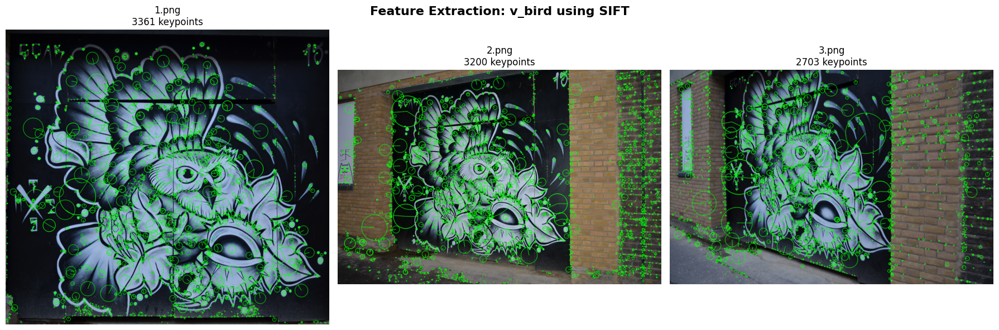


Scene: v_graffiti


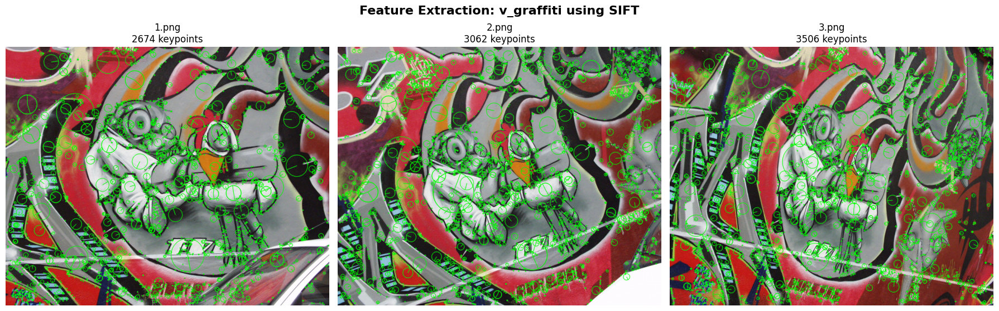

In [8]:
def visualize_scene_features(scene_name, detector_name='SIFT', num_images=3):
    """
    Visualize features extracted from multiple images in a scene.
    
    Args:
        scene_name: Name of the scene
        detector_name: Which detector to visualize
        num_images: Number of images to show
    """
    if scene_name not in all_features:
        print(f"Scene {scene_name} not found!")
        return
    
    if detector_name not in all_features[scene_name]:
        print(f"Detector {detector_name} not available for scene {scene_name}!")
        return
    
    features = all_features[scene_name][detector_name]
    image_names = sorted(list(features.keys()))[:num_images]
    
    # Create figure
    fig, axes = plt.subplots(1, num_images, figsize=(6*num_images, 6))
    if num_images == 1:
        axes = [axes]
    
    fig.suptitle(f'Feature Extraction: {scene_name} using {detector_name}', 
                 fontsize=16, fontweight='bold')
    
    for idx, img_name in enumerate(image_names):
        feature_data = features[img_name]
        img_color = feature_data['image_color']
        keypoints = feature_data['keypoints']
        
        # Draw keypoints
        img_with_kp = visualize_keypoints(img_color, keypoints, detector_name, img_name)
        
        axes[idx].imshow(img_with_kp)
        axes[idx].set_title(f'{img_name}\n{len(keypoints)} keypoints', fontsize=12)
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()


# Visualize features for a couple of scenes
print("Visualizing feature extraction results:\n")

# Choose different scenes to showcase variety
example_scenes = ['v_bird', 'v_graffiti']

for scene in example_scenes:
    if scene in all_features:
        print(f"\nScene: {scene}")
        visualize_scene_features(scene, 'SIFT', num_images=3)

### 1.7 Statistical Analysis of Feature Detectors

Let's compare the performance characteristics of different detectors by analyzing:
- Number of keypoints detected per image
- Average keypoints across all scenes
- Computational efficiency (if timing info available)

This analysis helps justify which detector to use for different stages of the pipeline.

In [9]:
def analyze_detector_statistics():
    """
    Analyze and compare statistics of different feature detectors.
    """
    print("Feature Detector Comparison")
    print("="*80)
    
    # Collect statistics
    stats = {}
    
    for detector_name in ['SIFT', 'ORB']:
        stats[detector_name] = {
            'total_keypoints': 0,
            'num_images': 0,
            'keypoints_per_scene': {}
        }
        
        for scene_name in scene_names:
            if scene_name in all_features and detector_name in all_features[scene_name]:
                features = all_features[scene_name][detector_name]
                scene_keypoints = sum(f['keypoints'].__len__() for f in features.values())
                num_images = len(features)
                
                stats[detector_name]['total_keypoints'] += scene_keypoints
                stats[detector_name]['num_images'] += num_images
                stats[detector_name]['keypoints_per_scene'][scene_name] = {
                    'total': scene_keypoints,
                    'avg': scene_keypoints / num_images if num_images > 0 else 0
                }
    
    # Print comparison table
    print(f"\n{'Detector':<10} {'Total Images':<15} {'Total Keypoints':<18} {'Avg per Image':<15}")
    print("-"*80)
    
    for detector_name, data in stats.items():
        if data['num_images'] > 0:
            avg_per_image = data['total_keypoints'] / data['num_images']
            print(f"{detector_name:<10} {data['num_images']:<15} {data['total_keypoints']:<18} {avg_per_image:<15.1f}")
    
    # Print per-scene breakdown
    print("\n\nPer-Scene Breakdown:")
    print("="*80)
    
    for scene_name in scene_names:
        print(f"\n{scene_name}:")
        print(f"{'  Detector':<12} {'Total Keypoints':<18} {'Avg per Image':<15}")
        print("  " + "-"*70)
        
        for detector_name in ['SIFT', 'ORB']:
            if scene_name in stats[detector_name]['keypoints_per_scene']:
                scene_stats = stats[detector_name]['keypoints_per_scene'][scene_name]
                print(f"  {detector_name:<12} {scene_stats['total']:<18} {scene_stats['avg']:<15.1f}")
    
    return stats

# Run the analysis
feature_stats = analyze_detector_statistics()

Feature Detector Comparison

Detector   Total Images    Total Keypoints    Avg per Image  
--------------------------------------------------------------------------------
SIFT       36              133917             3719.9         
ORB        36              70089              1946.9         


Per-Scene Breakdown:

v_boat:
  Detector   Total Keypoints    Avg per Image  
  ----------------------------------------------------------------------
  SIFT         41041              6840.2         
  ORB          12000              2000.0         

v_weapons:
  Detector   Total Keypoints    Avg per Image  
  ----------------------------------------------------------------------
  SIFT         23916              3986.0         
  ORB          12000              2000.0         

v_bird:
  Detector   Total Keypoints    Avg per Image  
  ----------------------------------------------------------------------
  SIFT         19593              3265.5         
  ORB          12000              2000

## Part 2: Feature Matching

In this part, I'll implement feature matching between image pairs to find corresponding points.

**Matching Strategy:**
- Use **k-Nearest Neighbors (k=2)** to find the two closest matches for each descriptor
- Apply **Lowe's Ratio Test** to filter out ambiguous matches
- Use **Euclidean distance** for SIFT descriptors (128-dim float vectors)
- Visualize matches to verify quality before using them for homography

### 2.1 Feature Matching with Lowe's Ratio Test

I'll implement the matching function using BFMatcher (Brute Force Matcher) with k-NN and Lowe's ratio test:
1. Find k=2 nearest neighbors for each descriptor
2. Apply ratio test: keep match if distance(best) / distance(second_best) < threshold
3. This filters out ambiguous matches where multiple features look similar

In [10]:
def match_features(descriptors1, descriptors2, ratio_threshold=0.75):
    """
    Match features between two images using k-NN and Lowe's ratio test.
    
    Args:
        descriptors1: Descriptors from first image (N x 128 for SIFT)
        descriptors2: Descriptors from second image (M x 128 for SIFT)
        ratio_threshold: Lowe's ratio test threshold (default 0.75)
    
    Returns:
        good_matches: List of good DMatch objects after ratio test
        all_matches: List of all matches before filtering
    """
    # Create BFMatcher with Euclidean distance (L2 norm) for SIFT
    # normType=cv2.NORM_L2 for float descriptors
    # crossCheck=False because we're using k-NN matching
    bf = cv2.BFMatcher(normType=cv2.NORM_L2, crossCheck=False)
    
    # Find k=2 nearest neighbors for each descriptor in descriptors1
    # This returns a list of lists: for each query descriptor, we get 2 best matches
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    
    # Apply Lowe's ratio test
    # The idea: if the best match is much better than the second best
    good_matches = []
    all_matches_list = []
    
    for match_pair in matches:
        # Some descriptors might have less than 2 matches
        if len(match_pair) == 2:
            best_match, second_match = match_pair
            all_matches_list.append(best_match)
            
            # Ratio test: best_distance / second_best_distance < threshold
            # Lower ratio = more distinctive = more reliable match
            if best_match.distance < ratio_threshold * second_match.distance:
                good_matches.append(best_match)
        elif len(match_pair) == 1:
            # Only one match found (no ambiguity)
            all_matches_list.append(match_pair[0])
            good_matches.append(match_pair[0])
    
    return good_matches, all_matches_list


# Test matching on a sample pair
print("Testing feature matching:\n")
print("="*60)

# Use the first scene for testing
test_scene = scene_names[0]
print(f"Test scene: {test_scene}\n")

# Get SIFT features for first two images
features_sift = all_features[test_scene]['SIFT']
img1_name = '1.png'
img2_name = '2.png'

kp1 = features_sift[img1_name]['keypoints']
desc1 = features_sift[img1_name]['descriptors']
img1 = features_sift[img1_name]['image_color']

kp2 = features_sift[img2_name]['keypoints']
desc2 = features_sift[img2_name]['descriptors']
img2 = features_sift[img2_name]['image_color']

print(f"Image 1: {img1_name} - {len(kp1)} keypoints")
print(f"Image 2: {img2_name} - {len(kp2)} keypoints")

# Match features
good_matches, all_matches = match_features(desc1, desc2, ratio_threshold=0.75)

print(f"\nMatching results:")
print(f"  Total matches found: {len(all_matches)}")
print(f"  Good matches (after ratio test): {len(good_matches)}")
print(f"  Filtered out: {len(all_matches) - len(good_matches)} ambiguous matches")
print(f"  Ratio: {len(good_matches)/len(all_matches)*100:.1f}% passed ratio test")

Testing feature matching:

Test scene: v_boat

Image 1: 1.png - 8849 keypoints
Image 2: 2.png - 8545 keypoints

Matching results:
  Total matches found: 8849
  Good matches (after ratio test): 2341
  Filtered out: 6508 ambiguous matches
  Ratio: 26.5% passed ratio test


### 2.2 Visualizing Feature Matches


Visualizing matches between consecutive images:



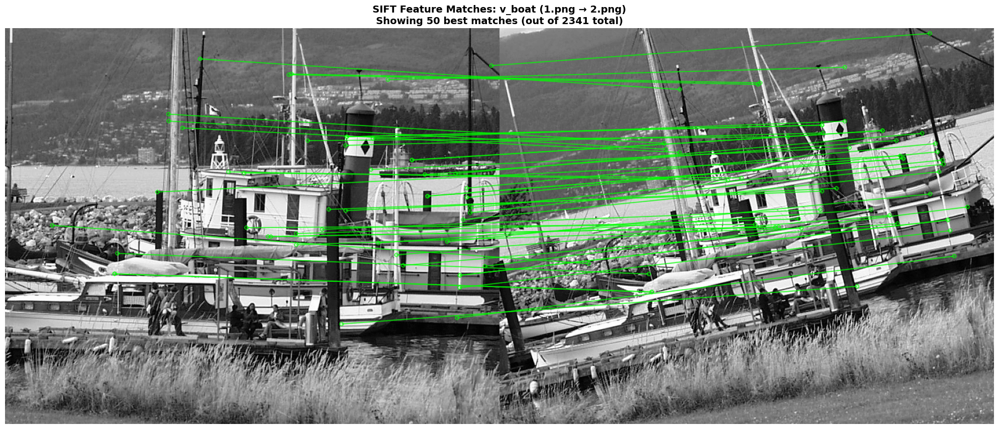

In [11]:
def visualize_matches(img1, kp1, img2, kp2, matches, title="Feature Matches", max_display=50):
    """
    Visualize feature matches between two images.
    
    Args:
        img1, img2: Input images (RGB)
        kp1, kp2: Keypoints from both images
        matches: List of DMatch objects
        title: Plot title
        max_display: Maximum number of matches to display (for clarity)
    
    Returns:
        img_matches: Image with drawn matches
    """
    # Sort matches by distance (best matches first)
    matches_sorted = sorted(matches, key=lambda x: x.distance)
    
    # Limit number of matches to display
    matches_to_draw = matches_sorted[:min(max_display, len(matches_sorted))]
    
    # Draw matches using OpenCV
    # Green lines connect matched keypoints
    img_matches = cv2.drawMatches(
        img1, kp1,
        img2, kp2,
        matches_to_draw,
        None,
        matchColor=(0, 255, 0),  # Green for match lines
        singlePointColor=(255, 0, 0),  # Red for unmatched keypoints
        flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS  # Don't draw unmatched
    )
    
    # Display
    plt.figure(figsize=(20, 10))
    plt.imshow(img_matches)
    plt.title(f'{title}\nShowing {len(matches_to_draw)} best matches (out of {len(matches)} total)', 
              fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return img_matches


# Visualize the matches we just computed
print("\nVisualizing matches between consecutive images:\n")
print("="*60)

_ = visualize_matches(
    img1, kp1,
    img2, kp2,
    good_matches,
    title=f"SIFT Feature Matches: {test_scene} ({img1_name} → {img2_name})",
    max_display=50
)

### 2.3 Experimenting with Different Ratio Thresholds

The ratio threshold is critical for match quality. Let's test different values:
- **0.6**: Very strict - fewer matches but higher quality
- **0.75**: Balanced - commonly used default (Lowe's paper)
- **0.9**: Permissive - more matches but potentially more outliers

In [12]:
# Compare different ratio thresholds
print("Comparing different Lowe's ratio thresholds:")
print("="*80)
print(f"{'Threshold':<12} {'Good Matches':<15} {'Percentage':<15} {'Description':<30}")
print("-"*80)

thresholds_to_test = [0.6, 0.75, 0.9]

for threshold in thresholds_to_test:
    good, all_m = match_features(desc1, desc2, ratio_threshold=threshold)
    percentage = (len(good) / len(all_m) * 100) if all_m else 0
    
    if threshold <= 0.65:
        desc = "Strict (high quality)"
    elif threshold <= 0.8:
        desc = "Balanced (recommended)"
    else:
        desc = "Permissive (more matches)"
    
    print(f"{threshold:<12.2f} {len(good):<15} {percentage:<15.1f}% {desc:<30}")

print("\n" + "="*80)
print("Note: Lower threshold = stricter filtering = fewer but more reliable matches")
print("      Higher threshold = more permissive = more matches but possibly more outliers")

Comparing different Lowe's ratio thresholds:
Threshold    Good Matches    Percentage      Description                   
--------------------------------------------------------------------------------
0.60         1769            20.0           % Strict (high quality)         
0.75         2341            26.5           % Balanced (recommended)        
0.90         3529            39.9           % Permissive (more matches)     

Note: Lower threshold = stricter filtering = fewer but more reliable matches
      Higher threshold = more permissive = more matches but possibly more outliers


### 2.4 Matching All Image Pairs in a Scene

For panorama stitching, I need to match consecutive image pairs (1->2, 2->3, 3->4, etc.).

In [13]:
def match_scene_pairs(scene_name, detector_name='SIFT', ratio_threshold=0.75):
    """
    Match all consecutive image pairs in a scene.
    
    Args:
        scene_name: Name of the scene to process
        detector_name: Which detector to use ('SIFT' or 'ORB')
        ratio_threshold: Lowe's ratio test threshold
    
    Returns:
        scene_matches: Dictionary containing all pair matches with metadata
    """
    features = all_features[scene_name][detector_name]
    image_names = sorted(features.keys())
    
    scene_matches = {}
    
    print(f"Matching consecutive pairs in scene: {scene_name}")
    print("="*70)
    
    # Match each consecutive pair: 1->2, 2->3, 3->4, etc.
    for i in range(len(image_names) - 1):
        img1_name = image_names[i]
        img2_name = image_names[i + 1]
        
        # Get features
        desc1 = features[img1_name]['descriptors']
        desc2 = features[img2_name]['descriptors']
        
        print(f"\nPair {i+1}: {img1_name} → {img2_name}")
        print("-"*70)
        
        # Match
        good_matches, all_matches = match_features(desc1, desc2, ratio_threshold)
        
        # Store everything we need for later (homography estimation)
        pair_key = f"{img1_name}_{img2_name}"
        scene_matches[pair_key] = {
            'img1_name': img1_name,
            'img2_name': img2_name,
            'matches': good_matches,
            'keypoints1': features[img1_name]['keypoints'],
            'keypoints2': features[img2_name]['keypoints'],
            'descriptors1': desc1,
            'descriptors2': desc2,
            'image1': features[img1_name]['image_color'],
            'image2': features[img2_name]['image_color'],
            'path1': features[img1_name]['path'],
            'path2': features[img2_name]['path']
        }
    
    return scene_matches


# Match all pairs in the test scene
print(f"\nMatching all pairs in scene: {test_scene}\n")
test_scene_matches = match_scene_pairs(test_scene, 'SIFT', ratio_threshold=0.75)


Matching all pairs in scene: v_boat

Matching consecutive pairs in scene: v_boat

Pair 1: 1.png → 2.png
----------------------------------------------------------------------

Pair 2: 2.png → 3.png
----------------------------------------------------------------------

Pair 3: 3.png → 4.png
----------------------------------------------------------------------

Pair 4: 4.png → 5.png
----------------------------------------------------------------------

Pair 5: 5.png → 6.png
----------------------------------------------------------------------


### 2.5 Visualizing Multiple Consecutive Pairs

Let's visualize matches for several consecutive pairs to see how match quality varies across the sequence.

Visualizing matches for first 3 consecutive pairs:

Pair: 1.png → 2.png
Number of matches: 2341


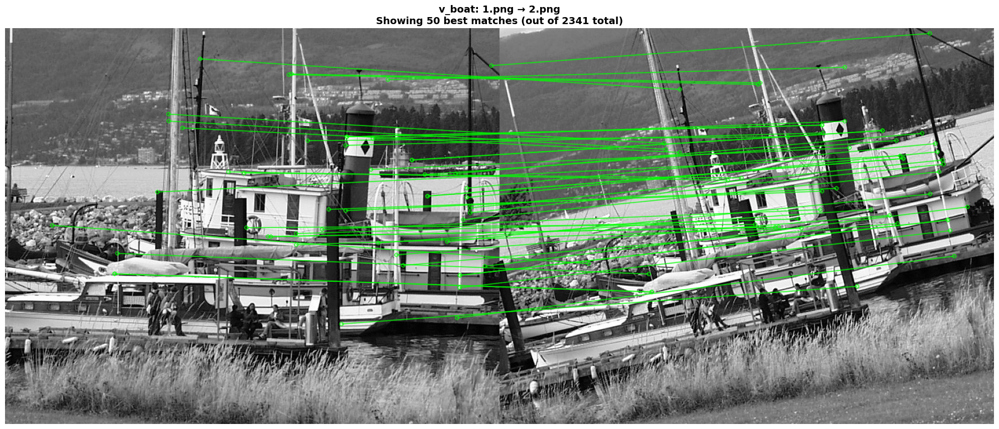


Pair: 2.png → 3.png
Number of matches: 2203


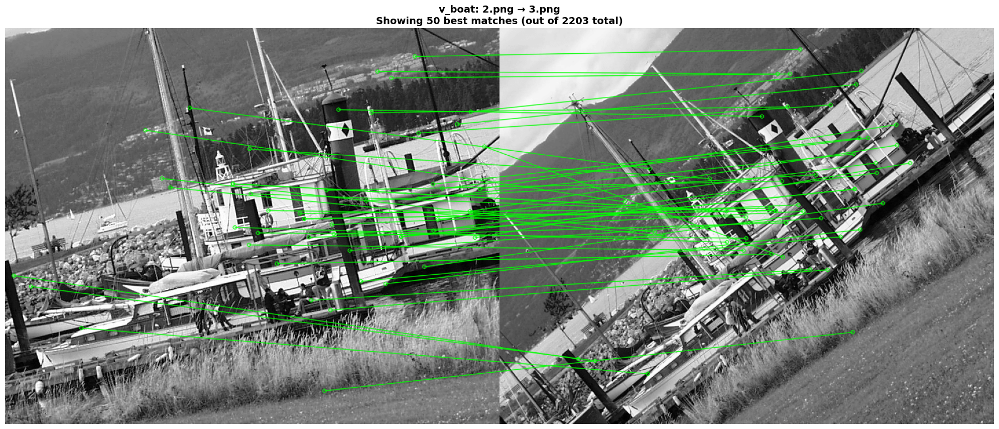


Pair: 3.png → 4.png
Number of matches: 1779


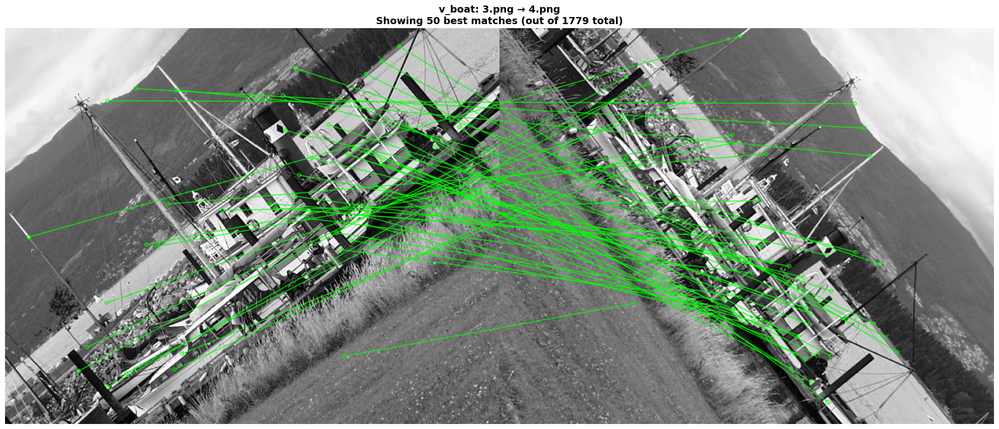

In [14]:
# Visualize first 3 pairs from the test scene
print("Visualizing matches for first 3 consecutive pairs:")
print("="*70)

pair_keys = list(test_scene_matches.keys())[:3]

for pair_key in pair_keys:
    pair_data = test_scene_matches[pair_key]
    
    print(f"\nPair: {pair_data['img1_name']} → {pair_data['img2_name']}")
    print(f"Number of matches: {len(pair_data['matches'])}")
    
    visualize_matches(
        pair_data['image1'], pair_data['keypoints1'],
        pair_data['image2'], pair_data['keypoints2'],
        pair_data['matches'],
        title=f"{test_scene}: {pair_data['img1_name']} → {pair_data['img2_name']}",
        max_display=50
    )

### 2.6 Match Quality Analysis

Analyze match quality across all pairs. This helps us understand:
- Which pairs have sufficient matches for homography estimation (need at least 4)
- How match quality varies across the sequence
- Whether any pairs might cause problems

In [15]:
def analyze_match_quality(scene_matches):
    """
    Analyze match quality for all pairs in a scene.
    
    Args:
        scene_matches: Dictionary of matched pairs
    """
    print("Match Quality Analysis")
    print("="*80)
    print(f"{'Image Pair':<25} {'Matches':<10} {'Avg Distance':<15} {'Quality':<15}")
    print("-"*80)
    
    for pair_key, pair_data in scene_matches.items():
        matches = pair_data['matches']
        num_matches = len(matches)
        
        # Calculate average match distance (lower is better)
        if num_matches > 0:
            avg_dist = sum(m.distance for m in matches) / num_matches
        else:
            avg_dist = float('inf')
        
        # Quality assessment
        if num_matches >= 50:
            quality = "Excellent"
        elif num_matches >= 30:
            quality = "Good"
        elif num_matches >= 15:
            quality = "Fair"
        elif num_matches >= 4:
            quality = "Minimal"
        else:
            quality = "Insufficient"
        
        pair_name = f"{pair_data['img1_name']}→{pair_data['img2_name']}"
        print(f"{pair_name:<25} {num_matches:<10} {avg_dist:<15.2f} {quality:<15}")
    
    # Summary statistics
    total_matches = sum(len(p['matches']) for p in scene_matches.values())
    avg_per_pair = total_matches / len(scene_matches) if scene_matches else 0
    min_matches = min(len(p['matches']) for p in scene_matches.values()) if scene_matches else 0
    max_matches = max(len(p['matches']) for p in scene_matches.values()) if scene_matches else 0
    
    print("\n" + "="*80)
    print(f"Total pairs: {len(scene_matches)}")
    print(f"Total matches: {total_matches}")
    print(f"Average matches per pair: {avg_per_pair:.1f}")
    print(f"Min/Max matches: {min_matches}/{max_matches}")
    print("\nNote: At least 4 matches required for homography estimation")


# Analyze the test scene
print("\nAnalyzing match quality:\n")
analyze_match_quality(test_scene_matches)


Analyzing match quality:

Match Quality Analysis
Image Pair                Matches    Avg Distance    Quality        
--------------------------------------------------------------------------------
1.png→2.png               2341       128.19          Excellent      
2.png→3.png               2203       119.16          Excellent      
3.png→4.png               1779       124.86          Excellent      
4.png→5.png               1508       135.78          Excellent      
5.png→6.png               1020       134.95          Excellent      

Total pairs: 5
Total matches: 8851
Average matches per pair: 1770.2
Min/Max matches: 1020/2341

Note: At least 4 matches required for homography estimation


### 2.7 Processing All Scenes

Now match all consecutive pairs in all scenes and store the results for Part 3 (Homography Estimation).

In [16]:
# Match all consecutive pairs in all scenes
all_scene_matches = {}

print("Processing all scenes...")
print("="*80)

for scene_name in scene_names:
    print(f"\nScene: {scene_name}")
    print("-"*80)
    
    # Match all pairs in this scene using SIFT
    scene_matches = match_scene_pairs(scene_name, 'SIFT', ratio_threshold=0.75)
    all_scene_matches[scene_name] = scene_matches
    
    # Quick summary
    total_matches = sum(len(p['matches']) for p in scene_matches.values())
    avg_matches = total_matches / len(scene_matches) if scene_matches else 0
    
    print(f"\n✓ Processed {len(scene_matches)} pairs")
    print(f"✓ Total matches: {total_matches}")
    print(f"✓ Average matches per pair: {avg_matches:.1f}")

print("\n" + "="*80)
print("All scenes matched successfully!")
print(f"Total scenes: {len(all_scene_matches)}")
print(f"Total pairs: {sum(len(s) for s in all_scene_matches.values())}")

Processing all scenes...

Scene: v_boat
--------------------------------------------------------------------------------
Matching consecutive pairs in scene: v_boat

Pair 1: 1.png → 2.png
----------------------------------------------------------------------

Pair 2: 2.png → 3.png
----------------------------------------------------------------------

Pair 3: 3.png → 4.png
----------------------------------------------------------------------

Pair 4: 4.png → 5.png
----------------------------------------------------------------------

Pair 5: 5.png → 6.png
----------------------------------------------------------------------

✓ Processed 5 pairs
✓ Total matches: 8851
✓ Average matches per pair: 1770.2

Scene: v_weapons
--------------------------------------------------------------------------------
Matching consecutive pairs in scene: v_weapons

Pair 1: 1.png → 2.png
----------------------------------------------------------------------

Pair 2: 2.png → 3.png
------------------------

### 2.8 Summary of Part 2

**What I implemented:**
1. ✅ Feature matching using BFMatcher with Euclidean distance (L2 norm)
2. ✅ k-Nearest Neighbors (k=2) to find best and second-best matches
3. ✅ Lowe's ratio test to filter ambiguous matches (threshold=0.75)
4. ✅ Match visualization with correspondence lines
5. ✅ Match quality analysis for all image pairs
6. ✅ Batch processing for all scenes

**Key Design Choices:**

**1. Euclidean Distance (L2 norm):**
   - SIFT uses 128-dimensional float descriptors
   - Euclidean distance properly measures similarity in this high-dimensional space
   - Alternative: For ORB (binary descriptors), we would use Hamming distance

**2. k-NN with k=2:**
   - We need two nearest neighbors for Lowe's ratio test
   - First neighbor = candidate match
   - Second neighbor = used to determine if match is distinctive

**3. Lowe's Ratio Test (threshold=0.75):**
   - Compares distance of best match vs. second-best match
   - If ratio < 0.75, the best match is significantly better → keep it
   - Filters out ambiguous matches where multiple features look similar
   - Lower threshold = stricter (fewer, higher quality matches)
   - Higher threshold = more permissive (more matches, possibly more outliers)

**How Match Quality Affects Homography:**

**✅ Good Matches (Correct Correspondences):**
   - Lead to accurate homography estimation
   - RANSAC can find the correct transformation
   - Well-distributed matches give stable results

**❌ Incorrect Matches (Outliers):**
   - Can bias the homography if not filtered
   - RANSAC will remove them, but too many outliers slow down convergence
   - May require more RANSAC iterations

**⚠️ Uneven Match Distribution:**
   - If matches cluster in one region, homography may not generalize well
   - Need matches across the entire overlap area
   - Sparse regions may have larger alignment errors

**🔢 Insufficient Matches:**
   - Need minimum 4 point correspondences to compute homography
   - More matches = more robust estimation with RANSAC
   - Fewer matches = less reliable, more sensitive to outliers

The matched features are now stored in `all_scene_matches` dictionary, ready for Part 3 (Homography Estimation using DLT and RANSAC).

In [ ]:
## Part 3: Homography Estimation

In this part, I'll implement:
1. **Direct Linear Transform (DLT)** - Compute homography from point correspondences
2. **Point Normalization** - Improve numerical stability
3. **RANSAC** - Robust estimation by rejecting outliers
4. **Visualization** - Show inliers vs outliers
5. **Evaluation** - Compute reprojection error

### Mathematical Background:

**Homography Transformation:**
A point in image 1 (x, y) maps to image 2 (x', y') via: